In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns

In [2]:
CSV_FILE = "/mnt/ibm_sm/maca/raw_cellxgene_csvs/190116_A00111_0256_BHH237DSXX/190116_A00111_0256_BHH237DSXX.csv"

In [3]:
#using pandas to look at it
#need to inverse columns/rows: pd.DataFrame.transpose()

df = pd.read_csv(CSV_FILE, header = 0)
dft=pd.DataFrame.transpose(df)

In [ ]:
#dft.loc[:] # .loc & .iloc for selecting rows only
##df.loc[[###],["XXX"]] #specific rows from column
#
#dft.shape #(rows, columns)
#dft.info()
#dft.describe()
dft[54224] 

In [ ]:
dft.head(5)

In [4]:
sc.settings.verbosity = 3             
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.1 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.8 pynndescent==0.5.5


In [ ]:
results_file= "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/practice_smartseq2_results_file.h5ad"
#results_file.write()

In [ ]:
#scanpy.read_10x_h5(filename, genome=None, gex_only=True, backup_url=None)
#scanpy.read_csv(filename, delimiter=',', first_column_names=None, dtype='float32')

In [5]:
adata_untransposed = sc.read_csv(CSV_FILE,
    delimiter=',',
    first_column_names = None)         
    
    # the directory with the,                 
    # use gene symbols for the variable names (variables-axis index)                               
    # write a cache file for faster subsequent reading


In [6]:
adata = adata_untransposed.T #transposing rows, columns

**.obs.index** for cells

**.var.index** for genes

In [7]:
adata.var.index 

Index(['0610005C13Rik', '0610006L08Rik', '0610009B22Rik', '0610009E02Rik',
       '0610009L18Rik', '0610010F05Rik', '0610010K14Rik', '0610012D04Rik',
       '0610012G03Rik', '0610025J13Rik',
       ...
       'n-R5s96', 'n-R5s97', 'n-R5s98', 'n-TSaga9', 'n-TStga1', '__no_feature',
       '__ambiguous', '__too_low_aQual', '__not_aligned',
       '__alignment_not_unique'],
      dtype='object', length=54449)

In [8]:
#checking if the file has mt- genes

def mt_gene_check(adata_object):
    '''Takes an AnnData object. Returns genes that begin with mt- and their index in adata.var.index list'''
    
    gene_list = list(adata_object.var.index)
    for gene in gene_list:
        if 'mt-' == gene[:3]:
            print(gene, list(adata.var.index).index(gene))

In [9]:
mt_gene_check(adata)

mt-Atp6 54224
mt-Atp8 54225
mt-Co1 54226
mt-Co2 54227
mt-Co3 54228
mt-Cytb 54229
mt-Nd1 54230
mt-Nd2 54231
mt-Nd3 54232
mt-Nd4 54233
mt-Nd4l 54234
mt-Nd5 54235
mt-Nd6 54236
mt-Rnr1 54237
mt-Rnr2 54238
mt-Ta 54239
mt-Tc 54240
mt-Td 54241
mt-Te 54242
mt-Tf 54243
mt-Tg 54244
mt-Th 54245
mt-Ti 54246
mt-Tk 54247
mt-Tl1 54248
mt-Tl2 54249
mt-Tm 54250
mt-Tn 54251
mt-Tp 54252
mt-Tq 54253
mt-Tr 54254
mt-Ts1 54255
mt-Ts2 54256
mt-Tt 54257
mt-Tv 54258
mt-Tw 54259
mt-Ty 54260


In [ ]:
adata_untransposed.obs.index #should be list of cells, not genes shown here

In [ ]:
adata.obs.index #now it's showing cells after being transposed

In [ ]:
adata_untransposed.n_obs #genes

In [ ]:
adata_untransposed.n_vars #cells

In [ ]:
adata.n_obs #transposed, cells

In [ ]:
adata.n_vars #transposed, genes

In [ ]:
adata_untransposed # gene x cell

In [ ]:
adata #transposed, cell x gene

In [ ]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

PREPROCESSING

normalizing counts per cell
    finished (0:00:02)


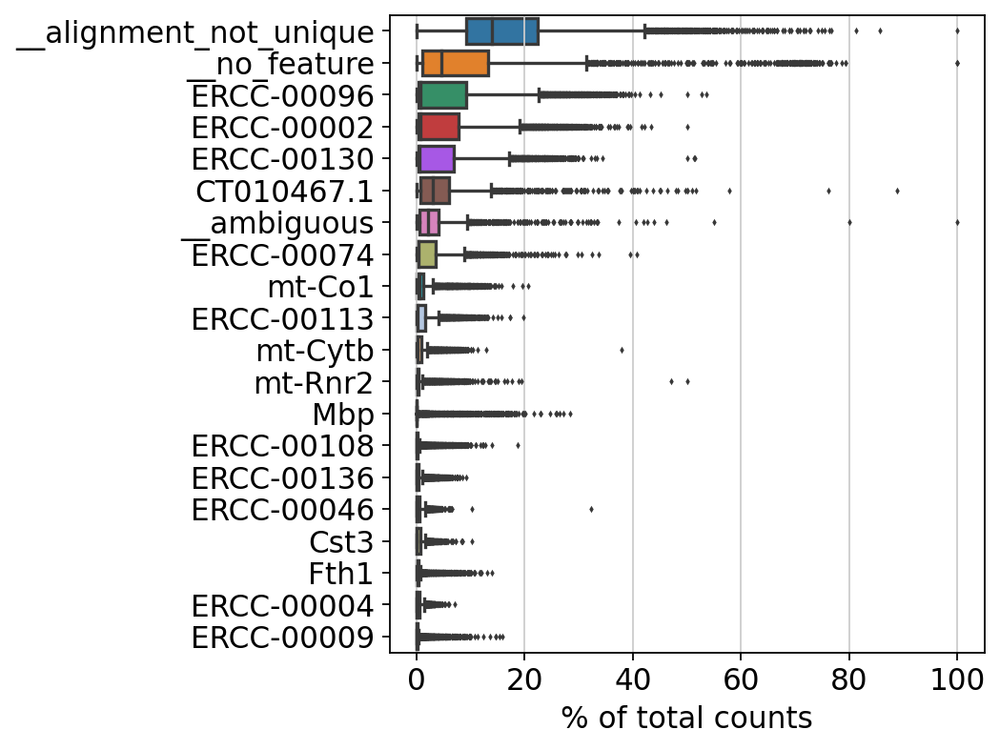

mt-Atp6 54224
mt-Atp8 54225
mt-Co1 54226
mt-Co2 54227
mt-Co3 54228
mt-Cytb 54229
mt-Nd1 54230
mt-Nd2 54231
mt-Nd3 54232
mt-Nd4 54233
mt-Nd4l 54234
mt-Nd5 54235
mt-Nd6 54236
mt-Rnr1 54237
mt-Rnr2 54238
mt-Ta 54239
mt-Tc 54240
mt-Td 54241
mt-Te 54242
mt-Tf 54243
mt-Tg 54244
mt-Th 54245
mt-Ti 54246
mt-Tk 54247
mt-Tl1 54248
mt-Tl2 54249
mt-Tm 54250
mt-Tn 54251
mt-Tp 54252
mt-Tq 54253
mt-Tr 54254
mt-Ts1 54255
mt-Ts2 54256
mt-Tt 54257
mt-Tv 54258
mt-Tw 54259
mt-Ty 54260


In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )
mt_gene_check(adata)

Basic Filtering

In [11]:
sc.pp.filter_cells(adata, min_genes=250)
sc.pp.filter_genes(adata, min_cells=3)#don't do this step, a constant loop keeps removing loop
mt_gene_check(adata)

filtered out 2301 cells that have less than 250 genes expressed
filtered out 18255 genes that are detected in less than 3 cells
mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


In [12]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
mt_gene_check(adata)

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


A violin plot of some of the computed quality measures:

    -the number of genes expressed in the count matrix
    -the total counts per cell
    -the percentage of counts in mitochondrial genes


In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts:

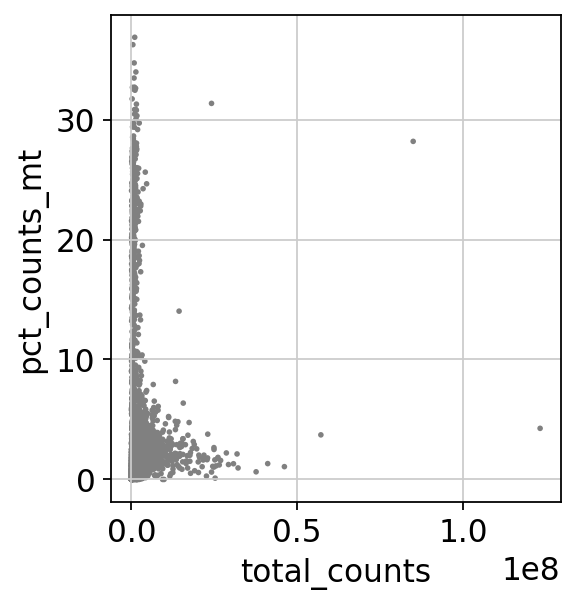

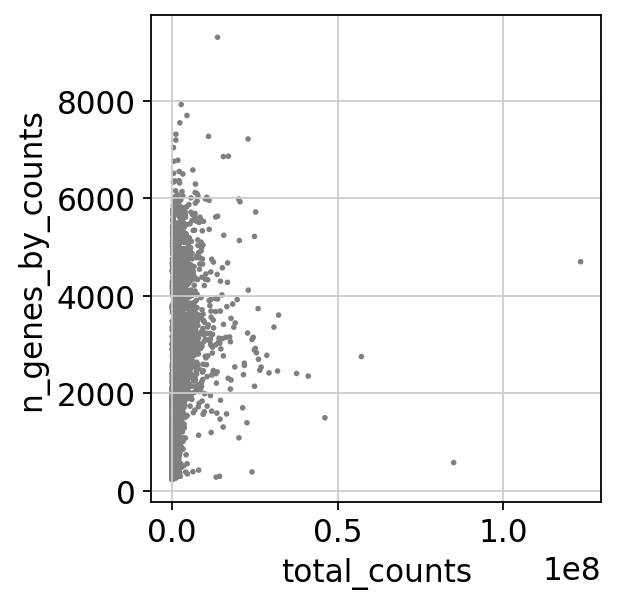

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


In [13]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
mt_gene_check(adata)

Actually do the filtering by slicing the AnnData object.

In [14]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :] #retaining less than 5% mt v. stringent, 20-30 %
mt_gene_check(adata)

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

In [15]:
#remove ERCC, subset data without ERCC 
sc.pp.normalize_total(adata, target_sum=1e4)
mt_gene_check(adata)

/mnt/ibm_sm/home/lea.mcgeever/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


Logarithmize the data:

In [16]:
sc.pp.log1p(adata)
mt_gene_check(adata)

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


Identify highly-variable genes.

In [17]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
mt_gene_check(adata)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


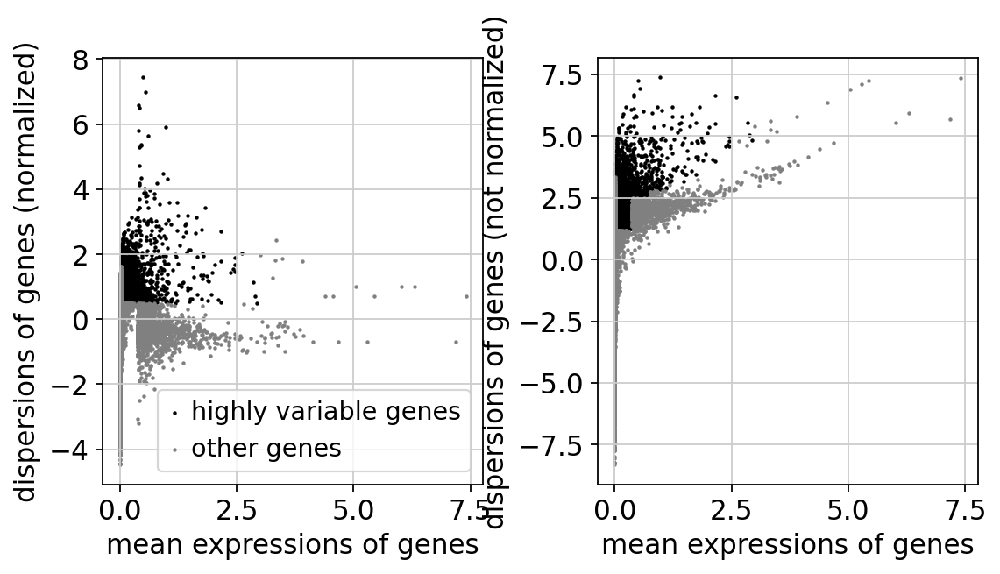

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


In [18]:
sc.pl.highly_variable_genes(adata)
mt_gene_check(adata)

Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

You can get back an AnnData of the object in .raw by calling .raw.to_adata().

In [19]:
adata.raw = adata

NOTE:
If you don’t proceed below with correcting the data with sc.pp.regress_out and scaling it via sc.pp.scale, you can also get away without using .raw at all.

The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifold/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

In [ ]:
adata = adata[:, adata.var.highly_variable]
mt_gene_check(adata)
#Filters out all mt genes except mt-Atp8 and mt-Nd3
#don't do this

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [20]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
mt_gene_check(adata)
#skip this step, no regression, may be hiding variability

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:02:12)
mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [21]:
sc.pp.scale(adata, max_value=10)
mt_gene_check(adata)
#optional, makes visuals slightly pretier

mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


**Principal component analysis**

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [22]:
sc.tl.pca(adata, svd_solver='arpack')
mt_gene_check(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
mt-Atp6 36136
mt-Atp8 36137
mt-Co1 36138
mt-Co2 36139
mt-Co3 36140
mt-Cytb 36141
mt-Nd1 36142
mt-Nd2 36143
mt-Nd3 36144
mt-Nd4 36145
mt-Nd4l 36146
mt-Nd5 36147
mt-Nd6 36148
mt-Rnr1 36149
mt-Rnr2 36150
mt-Ta 36151
mt-Te 36152
mt-Tf 36153
mt-Ti 36154
mt-Tl1 36155
mt-Tm 36156
mt-Tp 36157
mt-Tq 36158
mt-Tt 36159
mt-Tv 36160


We can make a scatter plot in the PCA coordinates, but we will not use that later on.

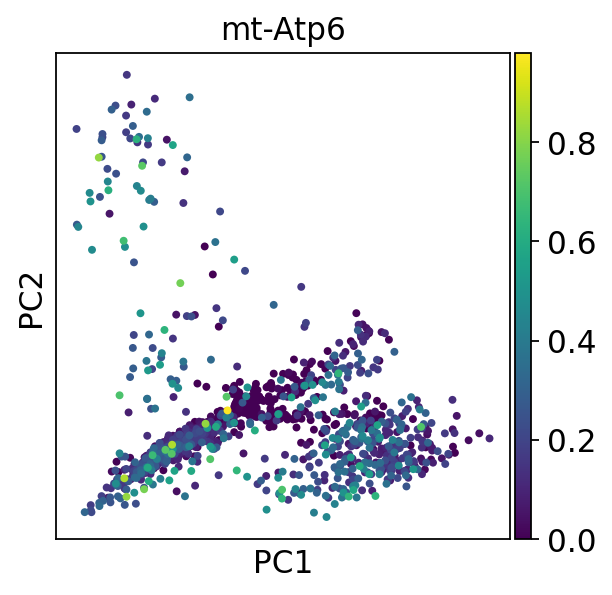

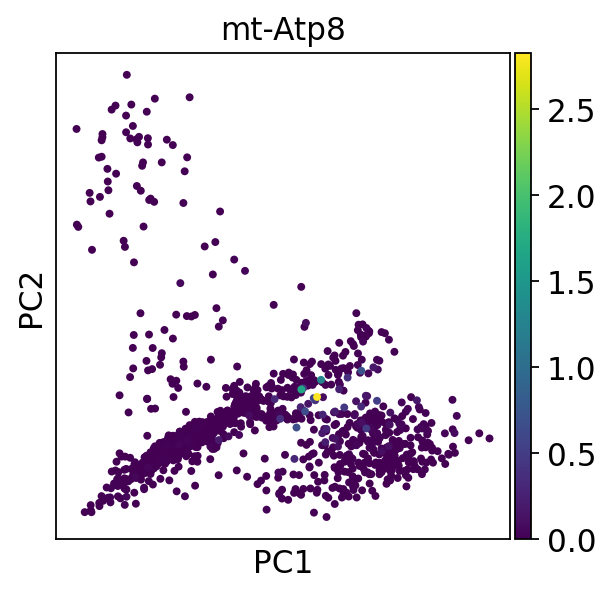

None None


In [23]:
print(sc.pl.pca(adata, color="mt-Atp6"), sc.pl.pca(adata, color="mt-Atp8"))

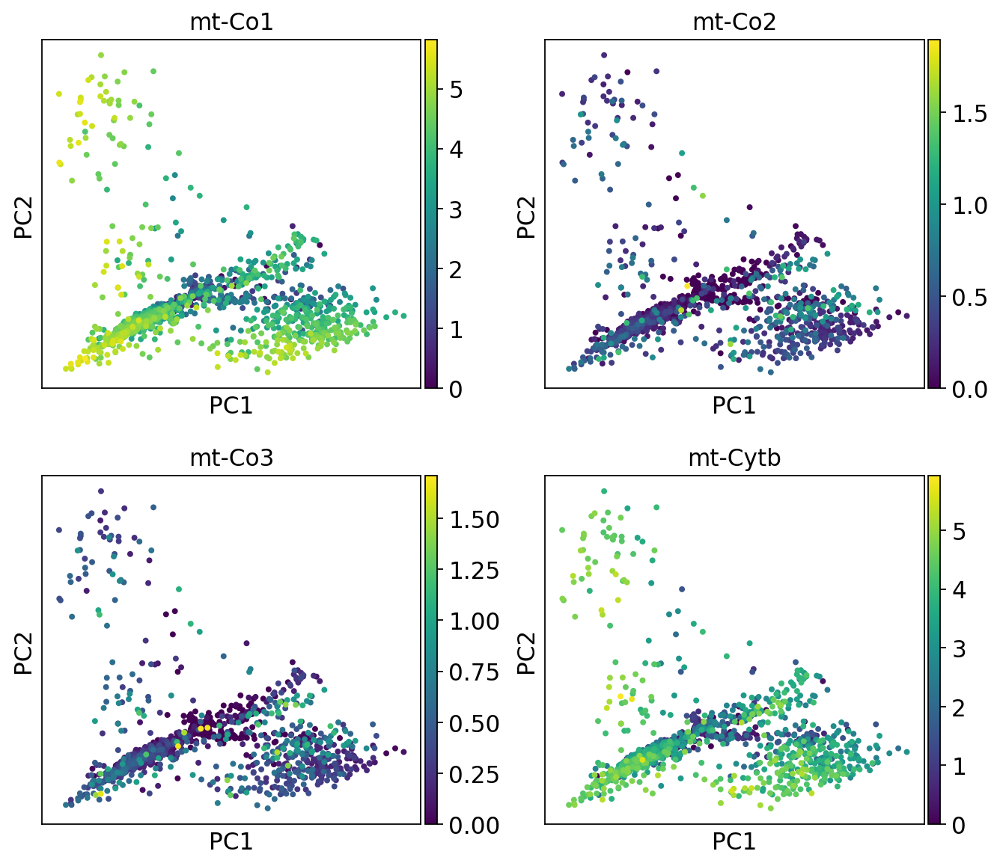

In [47]:
sc.pl.pca(adata, color=["mt-Co1", "mt-Co2", "mt-Co3", "mt-Cytb"], ncols = 2)
#make list of mt genes and call list for 'color'

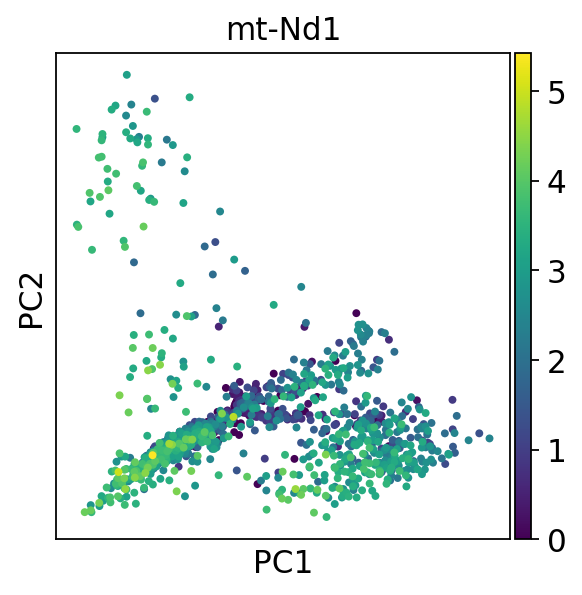

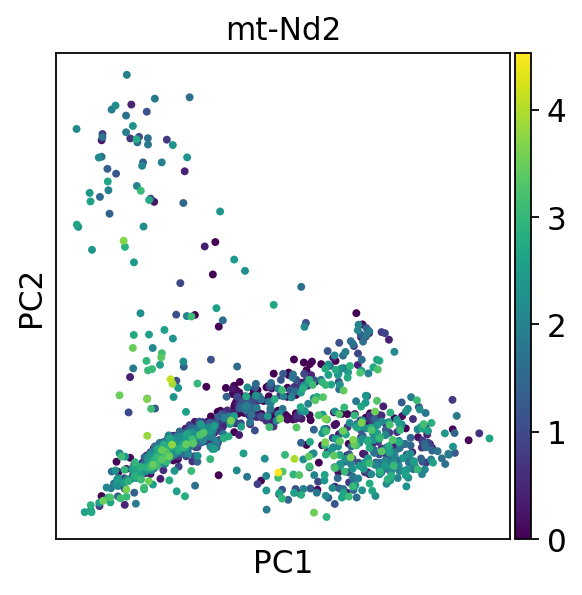

None None


In [30]:
print(sc.pl.pca(adata, color="mt-Nd1"), sc.pl.pca(adata, color="mt-Nd2"))

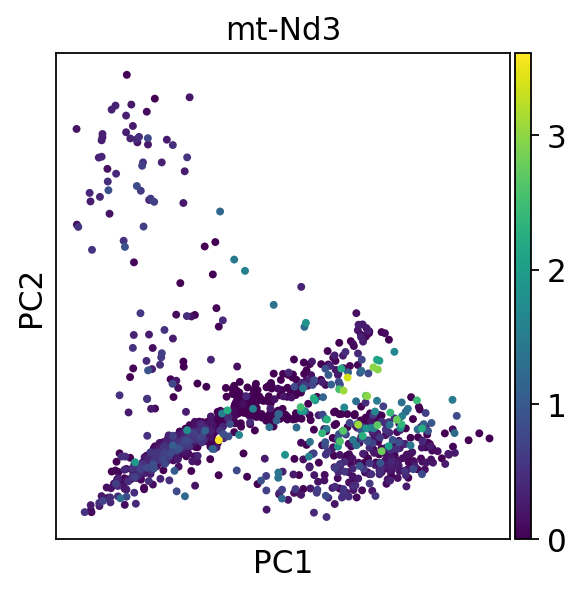

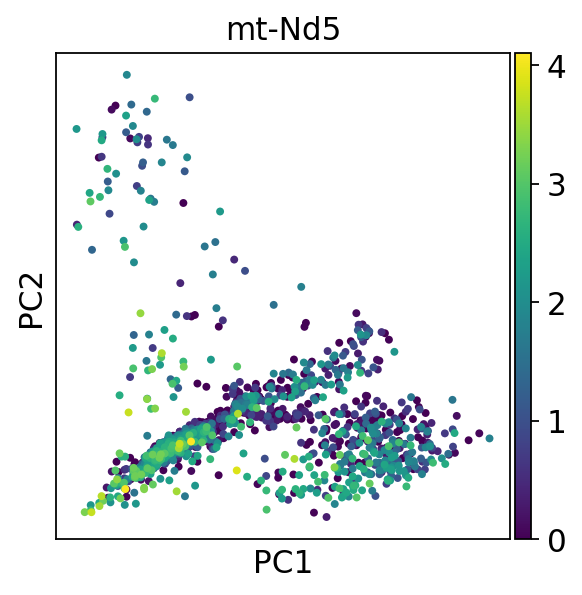

None None


In [31]:
print(sc.pl.pca(adata, color="mt-Nd3"), sc.pl.pca(adata, color="mt-Nd5"))

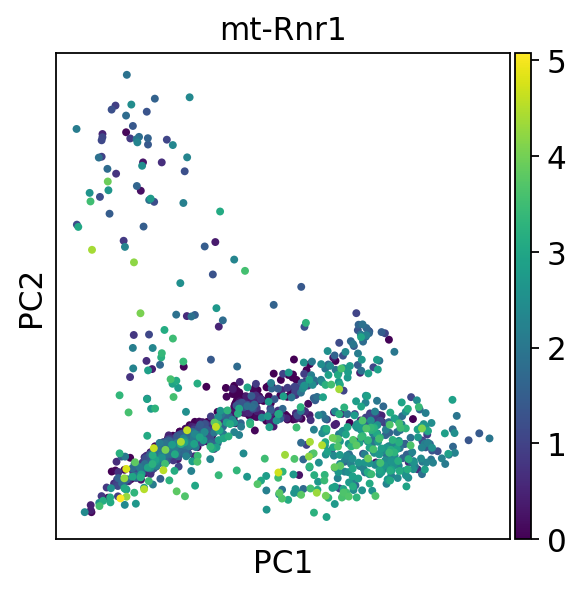

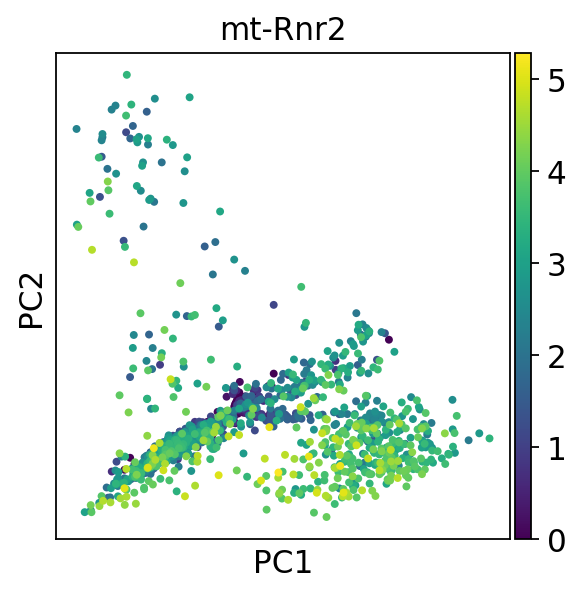

None None


In [32]:
print(sc.pl.pca(adata, color="mt-Rnr1"), sc.pl.pca(adata, color="mt-Rnr2"))  

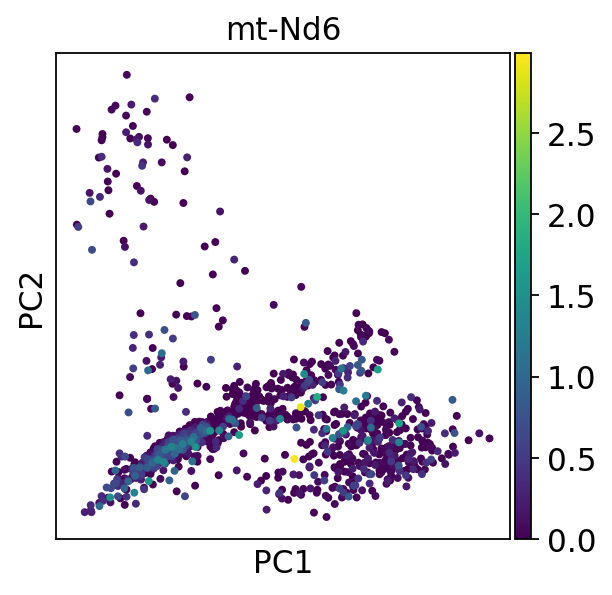

None


In [33]:
print(sc.pl.pca(adata, color="mt-Nd6"))

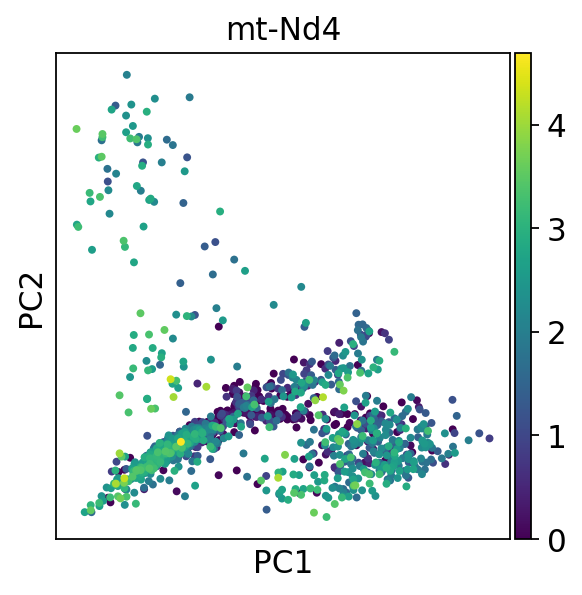

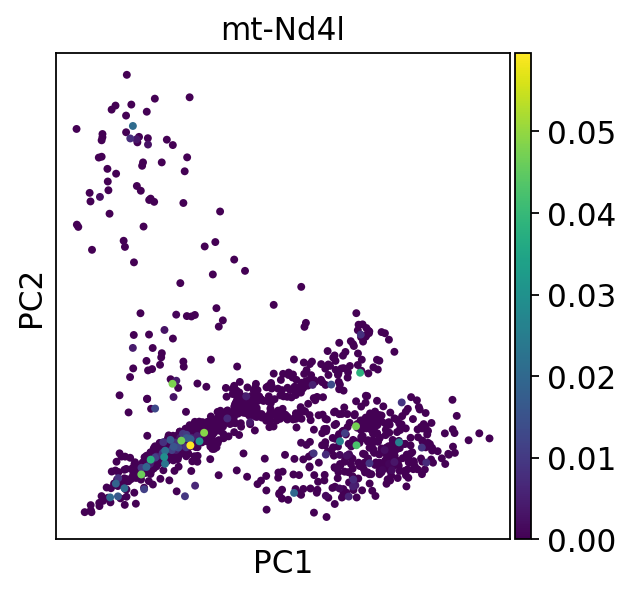

None None


In [34]:
print(sc.pl.pca(adata, color="mt-Nd4"), sc.pl.pca(adata, color="mt-Nd4l"))

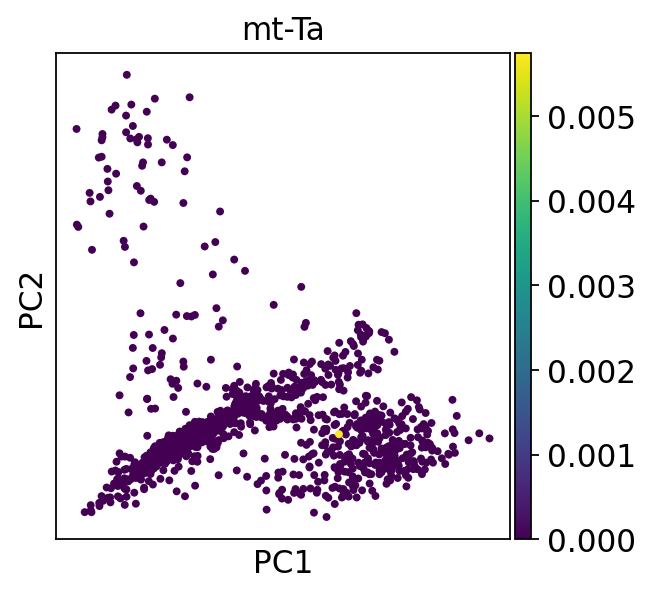

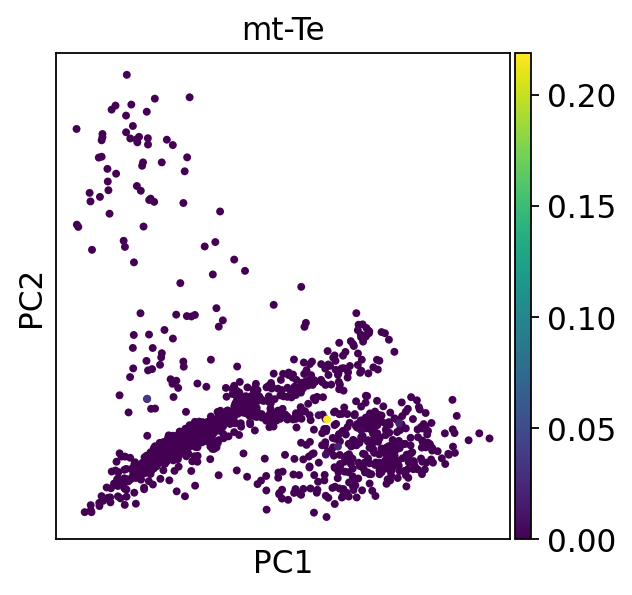

None None


In [35]:
print(sc.pl.pca(adata, color="mt-Ta"), sc.pl.pca(adata, color="mt-Te"))

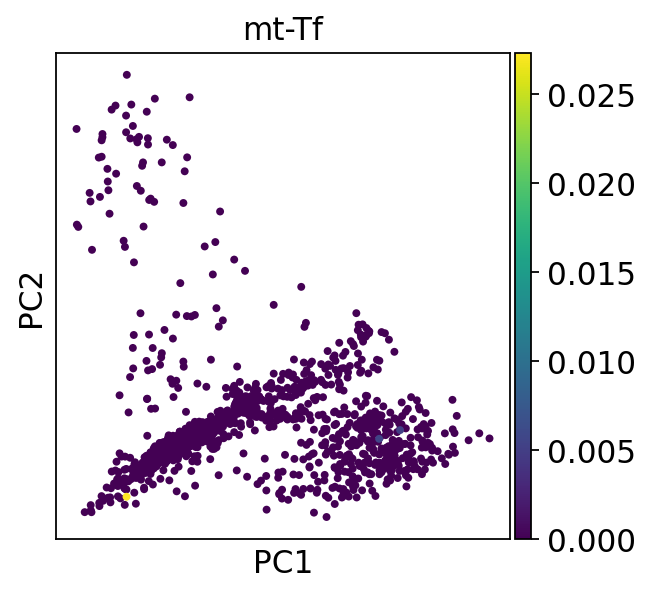

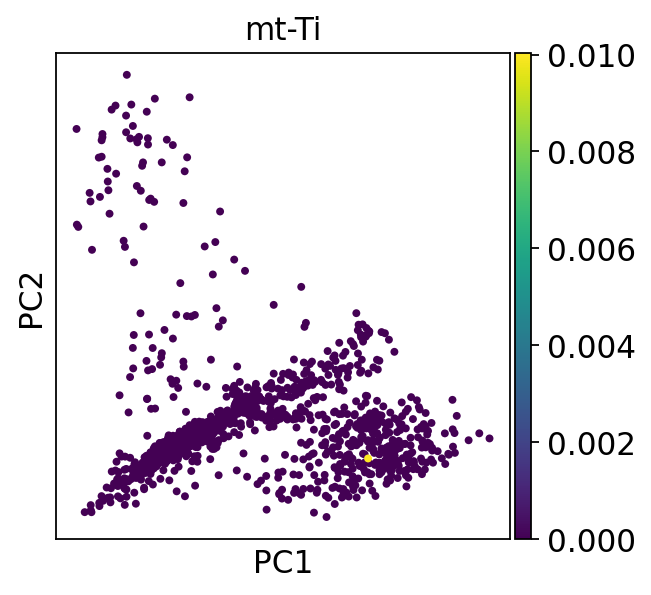

None None


In [36]:
print(sc.pl.pca(adata, color="mt-Tf"), sc.pl.pca(adata, color="mt-Ti"))

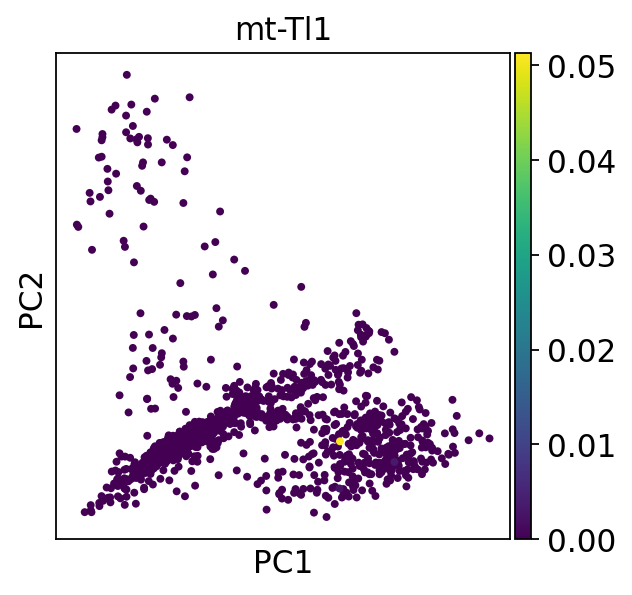

None


In [37]:
print(sc.pl.pca(adata, color="mt-Tl1"))

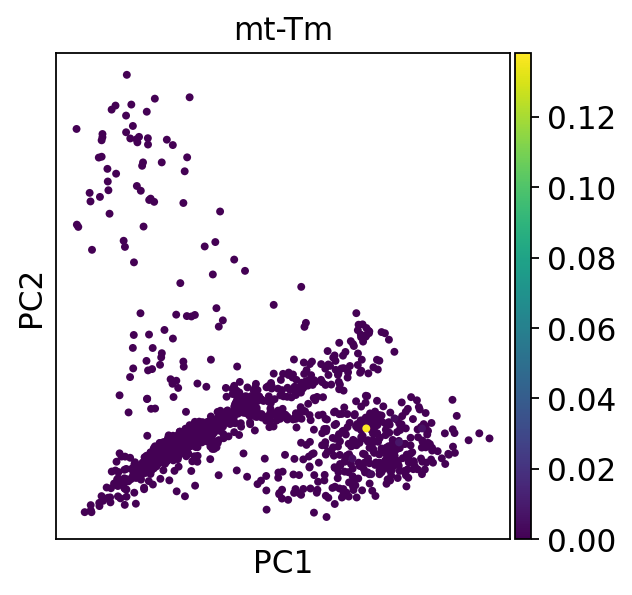

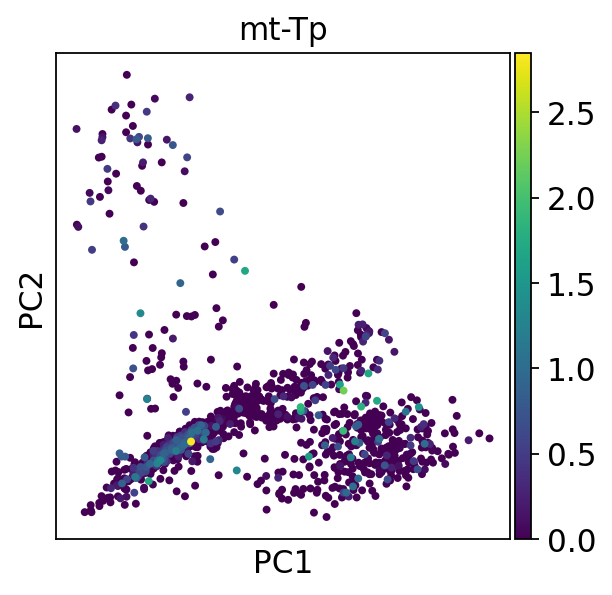

None None


In [38]:
print(sc.pl.pca(adata, color="mt-Tm"), sc.pl.pca(adata, color="mt-Tp"))

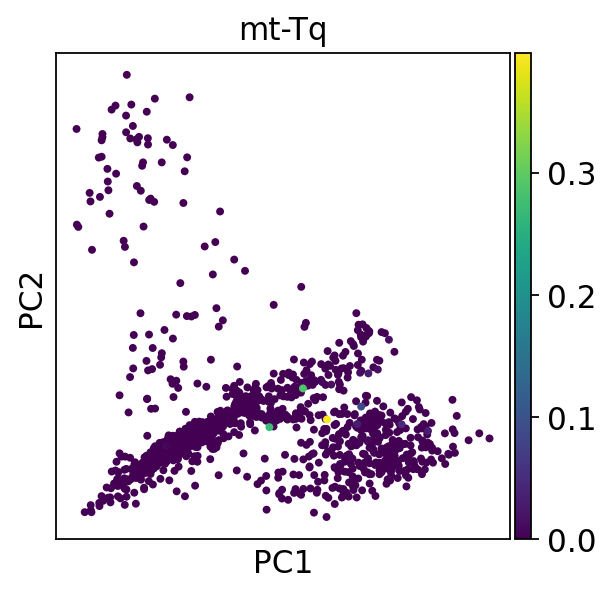

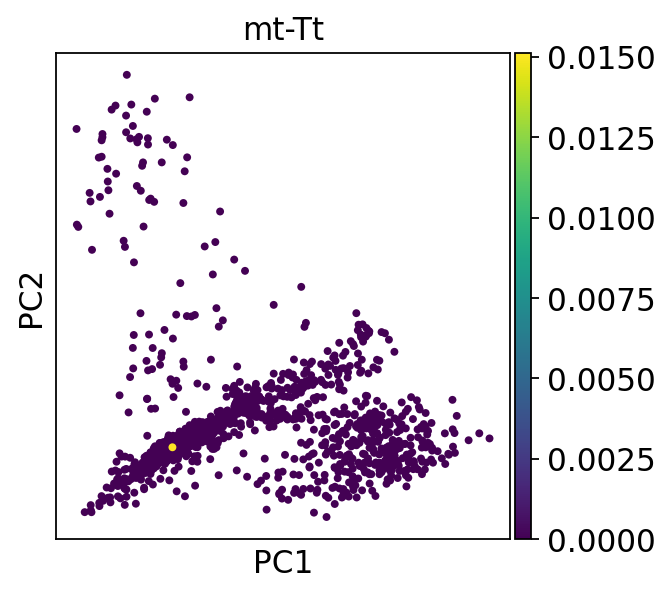

None None


In [39]:
print(sc.pl.pca(adata, color="mt-Tq"), sc.pl.pca(adata, color="mt-Tt"))

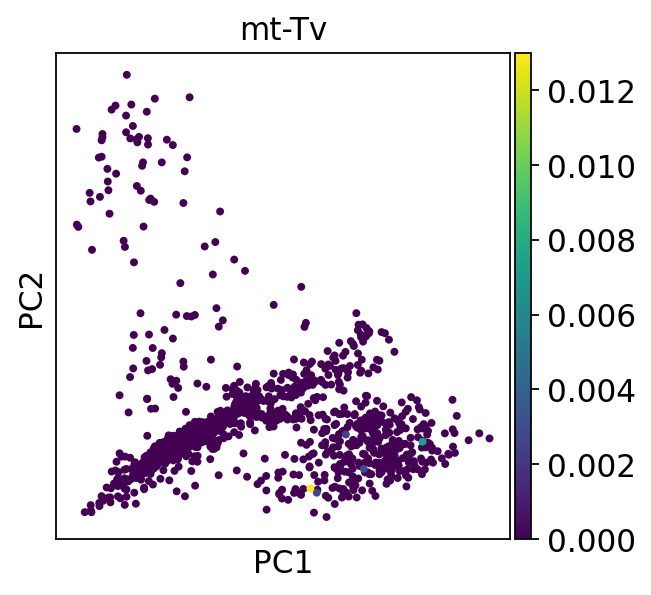

None


In [40]:
print(sc.pl.pca(adata, color="mt-Tv"))

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.

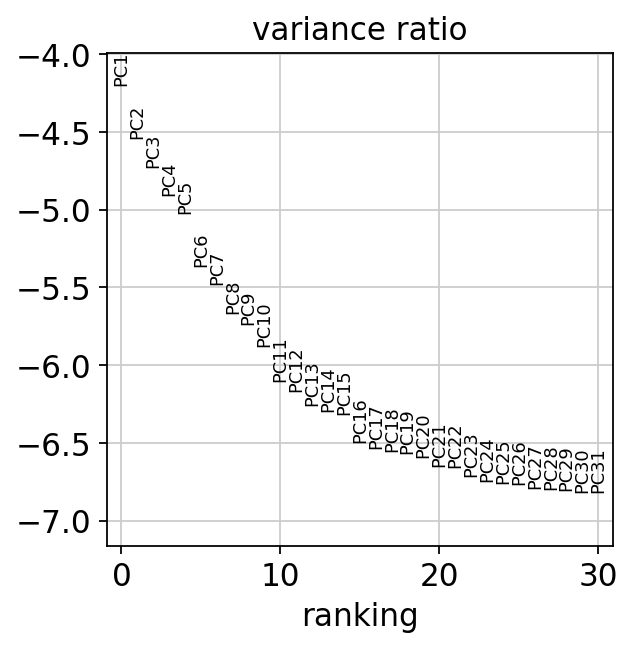

In [41]:
sc.pl.pca_variance_ratio(adata, log=True)

Save the result.

In [ ]:
adata.write(results_file)

In [42]:
adata

AnnData object with n_obs × n_vars = 2368 × 36194
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

**Computing the neighborhood graph**

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.

In [48]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


**Embedding the neighborhood graph**

We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

In [49]:
sc.tl.leiden(adata)

#sc.tl.paga(adata)
#sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
#don't need to compute papa, for higher order groups. umap better here
sc.tl.umap(adata)#, init_pos='paga')

running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [ ]:
# sc.tl.umap(adata) Would this need to be run again?

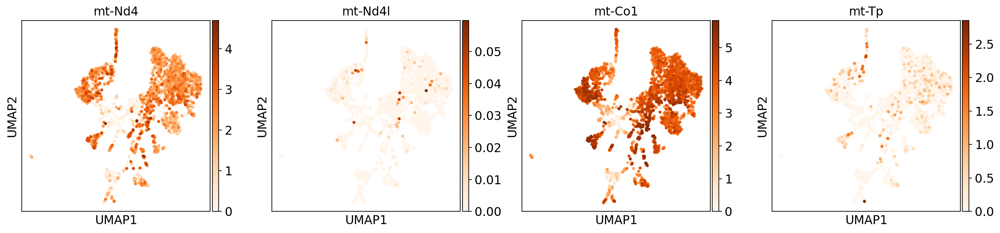

In [51]:
sc.pl.umap(adata, color=['mt-Nd4', 'mt-Nd4l', 'mt-Co1', 'mt-Tp'], cmap = "Oranges")

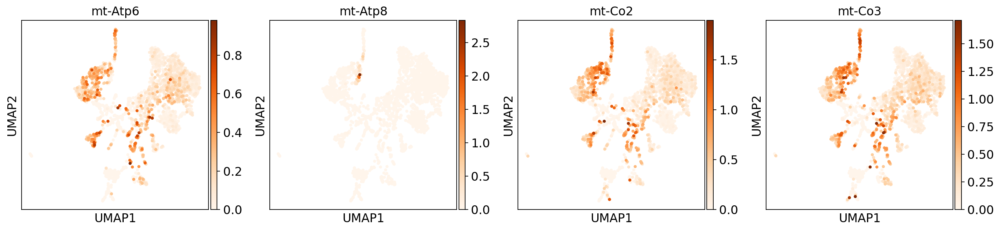

In [52]:
sc.pl.umap(adata, color=['mt-Atp6', 'mt-Atp8', 'mt-Co2', 'mt-Co3'], cmap = "Oranges")

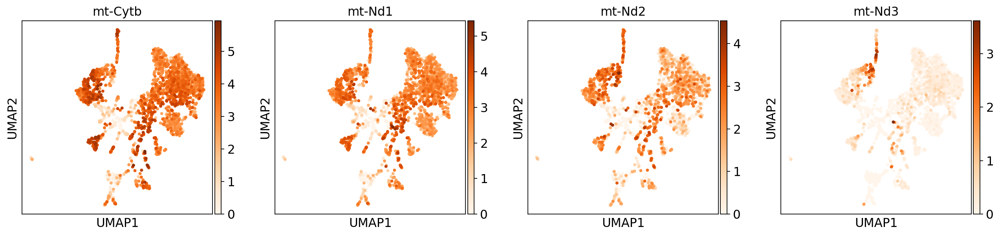

In [53]:
sc.pl.umap(adata, color=['mt-Cytb', 'mt-Nd1', 'mt-Nd2', 'mt-Nd3'], cmap = "Oranges")

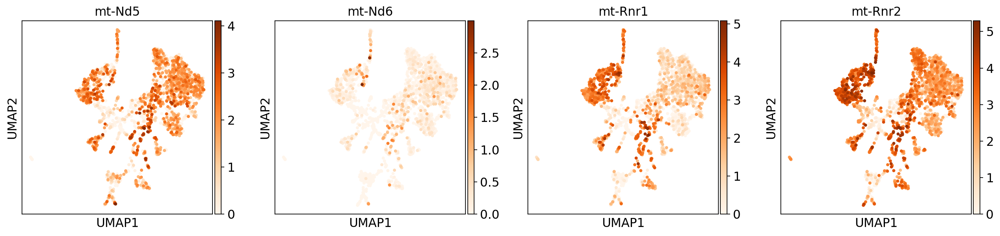

In [54]:
sc.pl.umap(adata, color=['mt-Nd5', 'mt-Nd6', 'mt-Rnr1', 'mt-Rnr2'], cmap = "Oranges")

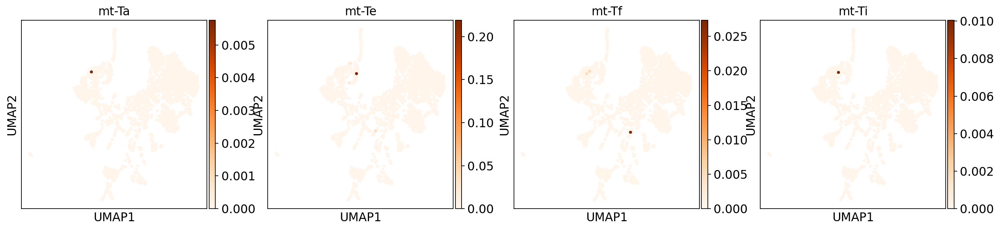

In [55]:
sc.pl.umap(adata, color=['mt-Ta', 'mt-Te', 'mt-Tf', 'mt-Ti'], cmap = "Oranges")

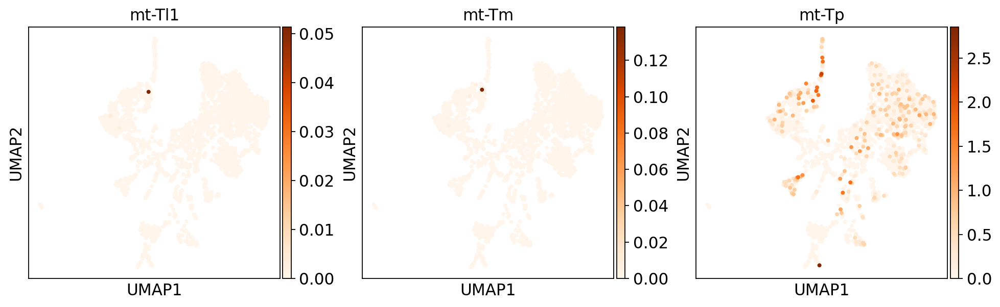

In [56]:
sc.pl.umap(adata, color=['mt-Tl1', 'mt-Tm', 'mt-Tp'], cmap = "Oranges") # 'mt-Tl2' isn't being found for some reason

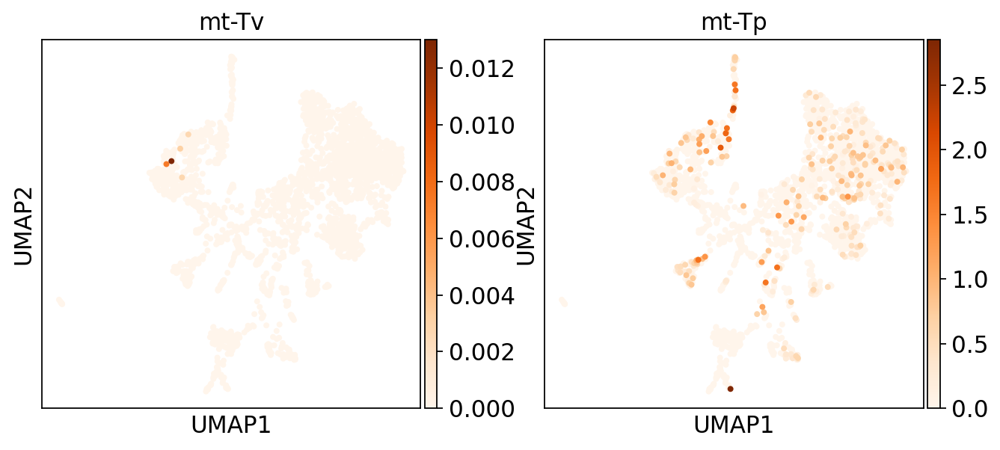

In [57]:
sc.pl.umap(adata, color=['mt-Tv', 'mt-Tp'], cmap = "Oranges")

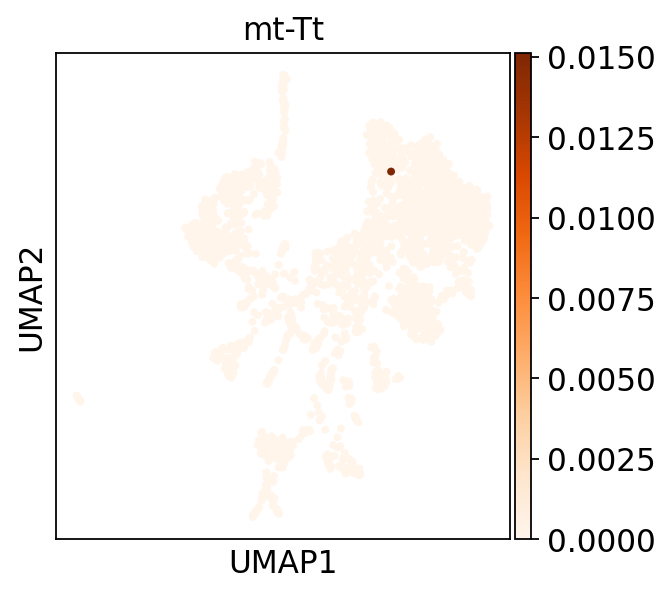

In [58]:
sc.pl.umap(adata, color=["mt-Tt"], cmap = "Oranges")

In [62]:
mt_genes = [
    "mt-Atp6",
    "mt-Atp8",
    "mt-Co1",
    "mt-Co2",
    "mt-Co3",
    "mt-Cytb",
    "mt-Nd1",
    "mt-Nd2",
    "mt-Nd3",
    "mt-Nd4",
    "mt-Nd4l",
    "mt-Nd5",
    "mt-Nd6",
    "mt-Rnr1",
    "mt-Rnr2",
    "mt-Ta",
    "mt-Te",
    "mt-Tf",
    "mt-Ti",
    "mt-Tl1",
#     "mt-Tl2",
    "mt-Tm",
    "mt-Tp",
    "mt-Tq",
    "mt-Tt",
    "mt-Tv"
]

As we set the .raw attribute of adata, the previous plots showed the “raw” (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don’t want to use .raw.

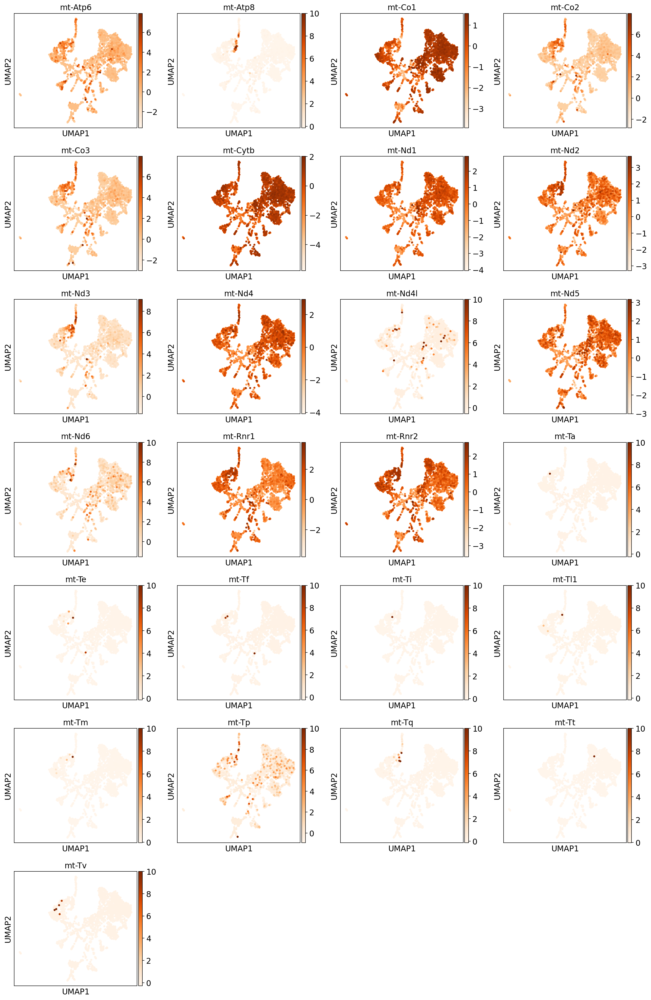

In [65]:
sc.pl.umap(adata, color= mt_genes, use_raw=False, cmap = "Oranges")

**Clustering the neighborhood graph**

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

Plot the clusters, which agree quite well with the result of Seurat.

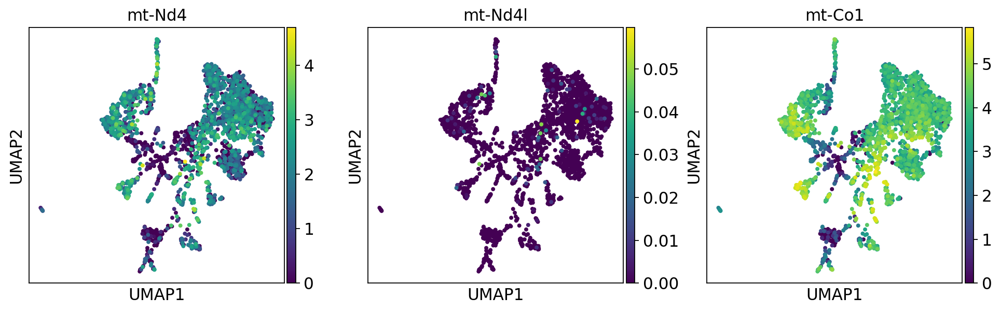

In [66]:
sc.pl.umap(adata, color=['mt-Nd4', 'mt-Nd4l', 'mt-Co1'])

In [ ]:
adata.write(results_file)

**Finding marker genes**

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


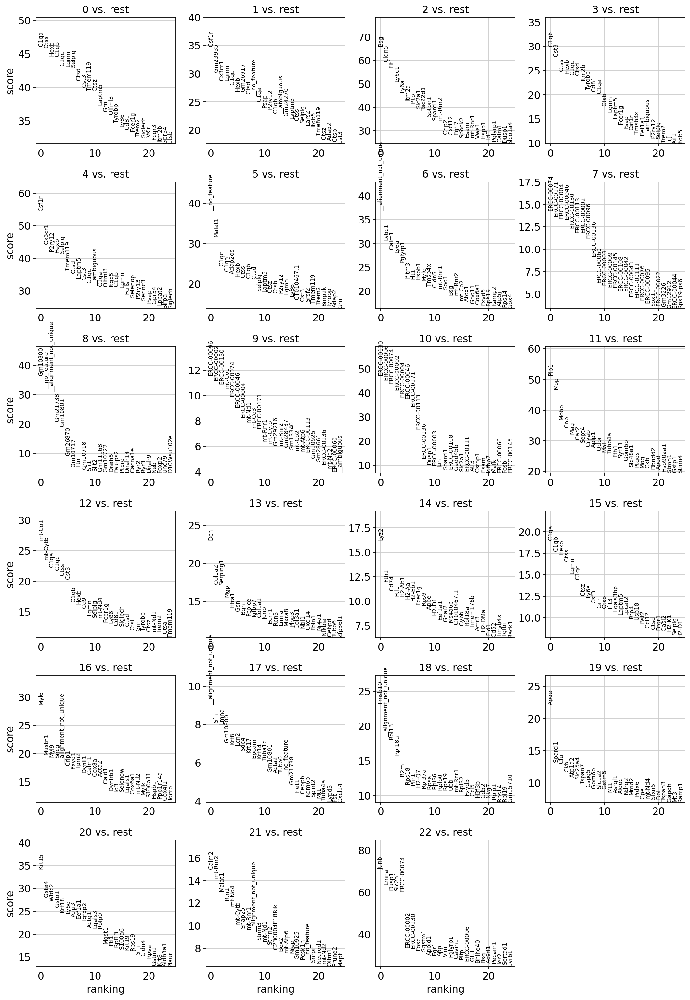

In [67]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
adata.uns['rank_genes_groups']['names']

In [ ]:
adata

In [ ]:
adata.obs["pct_counts_mt"]

<AxesSubplot:xlabel='pct_counts_mt', ylabel='Count'>

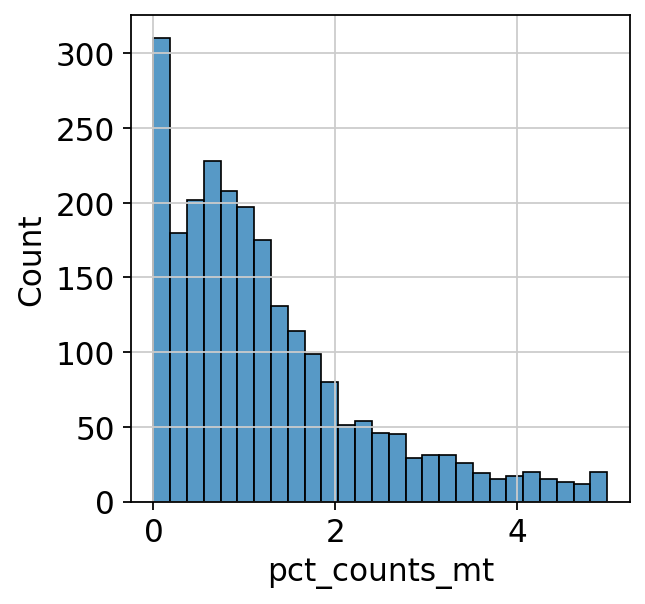

In [68]:
#sc.pp.calculate_qc_metrics(adata, qc_vars=([mt_genes]))

sns.histplot(adata.obs["pct_counts_mt"])

/mnt/ibm_sm/home/lea.mcgeever/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


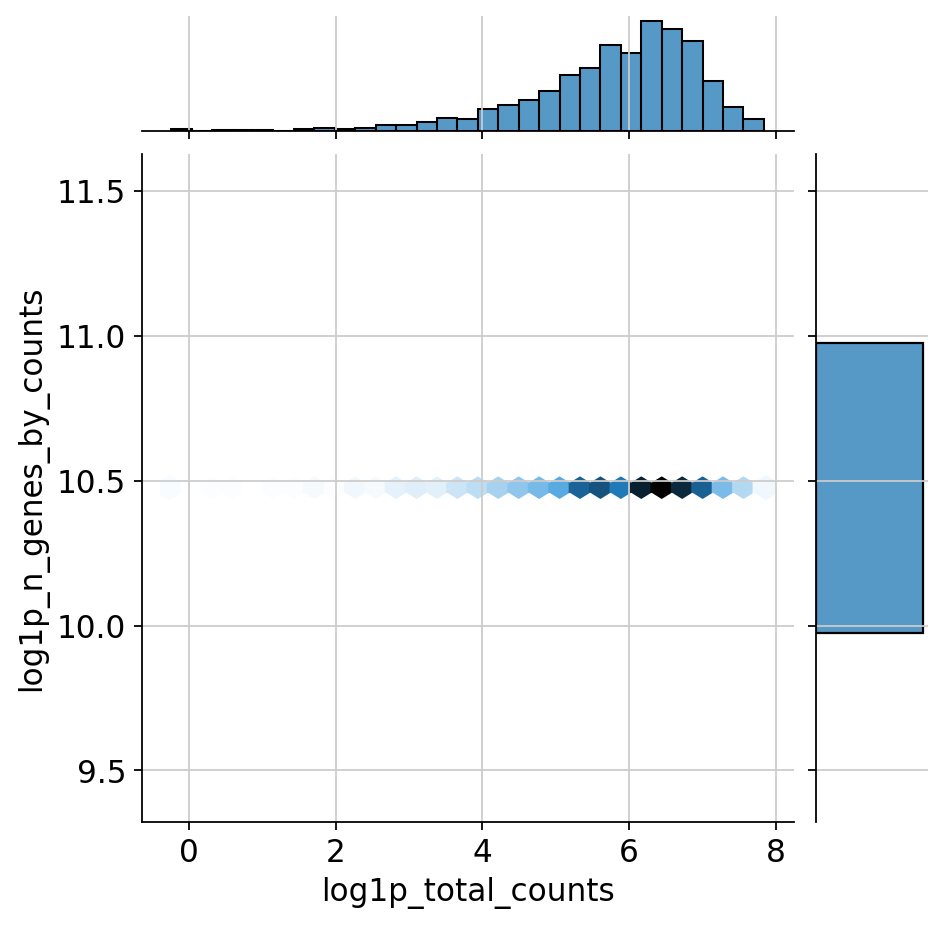

In [69]:
adata.var["mito"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mito"], inplace=True)
sns.jointplot(
    data=adata.obs,
    x="log1p_total_counts",
    y="log1p_n_genes_by_counts",
    kind="hex",
)

In [ ]:
#for fun
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4)

In [ ]:
#for fun
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, values_to_plot='logfoldchanges', min_logfoldchange=3, vmax=7, vmin=-7, cmap='bwr')

In [ ]:
sc.settings.verbosity = 2  # reduce the verbosity, how much you want it to 'talk' to you

The result of a Wilcoxon rank-sum (Mann-Whitney-U) test is very similar. We recommend using the latter in publications, see e.g., Sonison & Robinson (2018). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)


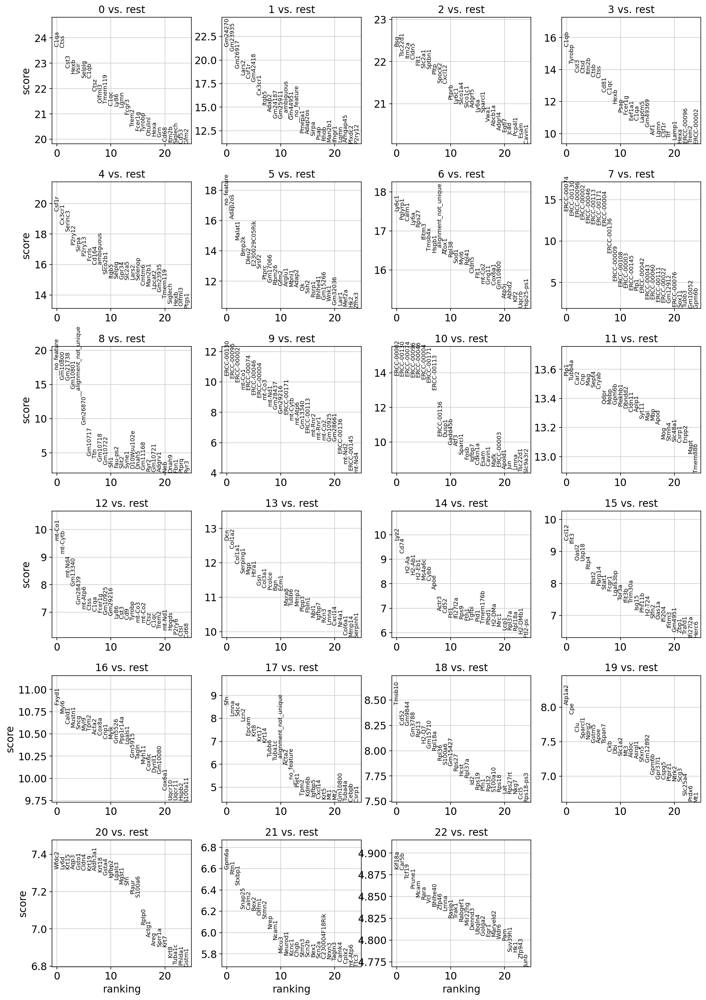

In [70]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)#already set to use .raw

In [ ]:
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by Natranos et al. (2018). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. Clark et al. (2014) has more details.

ranking genes


/mnt/ibm_sm/home/lea.mcgeever/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:21)


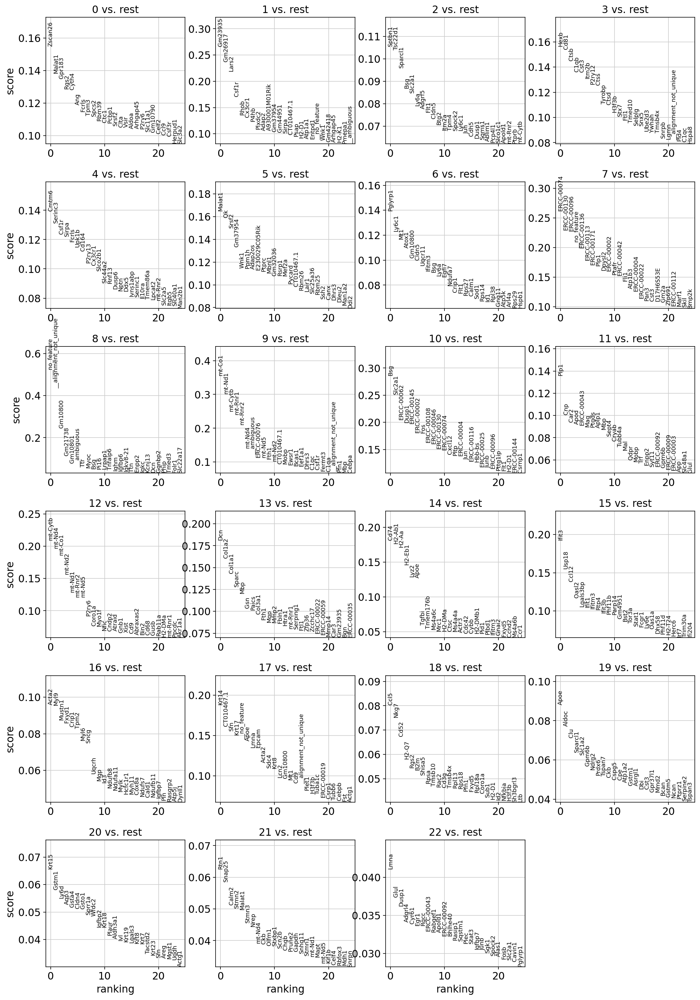

In [71]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [72]:
marker_genes = ['Mrps34','Mterf4','Nsun4','Tymp']
#just used a couple mito-related genes used as marker genes in mito diseases

In [ ]:
adata = sc.read(results_file)

In [73]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,Zscan26,Gm23935,Sptbn1,Hexb,Cmtm6,Malat1,Pglyrp1,ERCC-00074,__no_feature,mt-Co1,...,Dcn,Cd74,Ifit3,Acta2,Krt14,Ccl5,Apoe,Krt15,Rtn1,Lmna
1,Malat1,Gm26917,Tsc22d1,Cd81,Serinc3,Qk,Ly6c1,ERCC-00130,__alignment_not_unique,mt-Nd1,...,Col1a2,H2-Ab1,Usp18,Myl9,CT010467.1,Nkg7,Aldoc,Gstm1,Snap25,Glul
2,Gpr183,Lars2,Sparcl1,Ctsb,Csf1r,Srsf2,Mt1,ERCC-00096,Gm10800,mt-Cytb,...,Col1a1,H2-Aa,Ccl12,Mustn1,Sfn,Cd52,Clu,Ly6d,Calm2,Dusp1
3,Rgs2,Csf1r,Bsg,C1qb,Sirpa,Gm37954,Atox1,__no_feature,Gm21738,mt-Rnr1,...,Sparc,H2-Eb1,Oasl2,Fxyd1,Krt17,H2-Q7,Sparcl1,Aqp3,Stmn2,Adgrl4
4,Cyth4,Rhob,Slc2a1,Cst3,Fcrls,Wnk1,Gm10800,ERCC-00136,Gm10801,mt-Rnr2,...,Mbp,Lyz2,Lgals3bp,Crip1,__no_feature,Rgs2,Slc1a2,Gsta4,Malat1,Cyr61
5,Ang,Cx3cr1,Ly6a,Itm2b,Upk1b,Ppm1h,Cldn5,ERCC-00113,__ambiguous,mt-Nd4,...,Gsn,Apoe,Ifit1,Tpm2,Apoe,B2m,Gpm6b,Cldn4,Stmn3,Egr1
6,Fcrls,P4hb,Adgrf5,P2ry12,Cd164,Adap2os,Uqcr11,ERCC-00171,Ttr,__ambiguous,...,Paics,Tgfbi,Ifitm3,Myl6,Lmna,Shisa5,Ndrg2,Gsto1,Nrep,Rgcc
7,Tpm3,Plxdc2,Flt1,Ctss,P2ry13,E230029C05Rik,Ifitm3,Plp1,Myoc,ERCC-00076,...,Col3a1,Tmem176b,Rtp4,Sncg,Epcam,Rpsa,Prdx6,Sprr1a,mt-Nd4,ERCC-00043
8,Spcs2,Adap2,Cldn5,Tyrobp,Cx3cr1,Ptprc,Bsg,Dpysl2,Bsg,mt-Nd5,...,Fth1,Ms4a6c,Ifit3b,Uqcrh,Acta2,Tmsb10,Tspan7,Wfdc2,Ckb,Rabgef1
9,Rbm39,A930001M01Rik,Btg2,Ctsd,Slco2b1,Mbnl1,Ly6a,ERCC-00002,Pi16,Fth1,...,Mgp,Mrc1,Phf11b,Mgp,Sdc4,Rac2,Ckb,Igfbp2,Olfm1,Apold1


In [74]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(5)
#error, hmm when 'pvals' is in key in ['names', 'pvals']

,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n,9_n,...,13_n,14_n,15_n,16_n,17_n,18_n,19_n,20_n,21_n,22_n
0,Zscan26,Gm23935,Sptbn1,Hexb,Cmtm6,Malat1,Pglyrp1,ERCC-00074,__no_feature,mt-Co1,...,Dcn,Cd74,Ifit3,Acta2,Krt14,Ccl5,Apoe,Krt15,Rtn1,Lmna
1,Malat1,Gm26917,Tsc22d1,Cd81,Serinc3,Qk,Ly6c1,ERCC-00130,__alignment_not_unique,mt-Nd1,...,Col1a2,H2-Ab1,Usp18,Myl9,CT010467.1,Nkg7,Aldoc,Gstm1,Snap25,Glul
2,Gpr183,Lars2,Sparcl1,Ctsb,Csf1r,Srsf2,Mt1,ERCC-00096,Gm10800,mt-Cytb,...,Col1a1,H2-Aa,Ccl12,Mustn1,Sfn,Cd52,Clu,Ly6d,Calm2,Dusp1
3,Rgs2,Csf1r,Bsg,C1qb,Sirpa,Gm37954,Atox1,__no_feature,Gm21738,mt-Rnr1,...,Sparc,H2-Eb1,Oasl2,Fxyd1,Krt17,H2-Q7,Sparcl1,Aqp3,Stmn2,Adgrl4
4,Cyth4,Rhob,Slc2a1,Cst3,Fcrls,Wnk1,Gm10800,ERCC-00136,Gm10801,mt-Rnr2,...,Mbp,Lyz2,Lgals3bp,Crip1,__no_feature,Rgs2,Slc1a2,Gsta4,Malat1,Cyr61


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


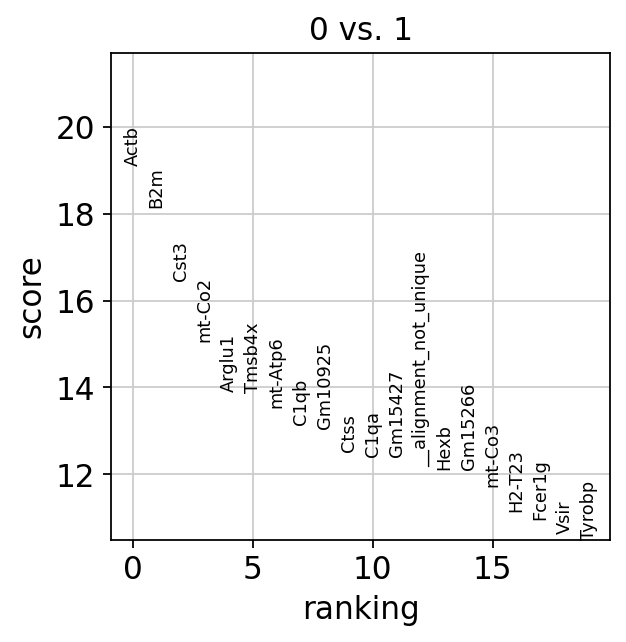

In [75]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

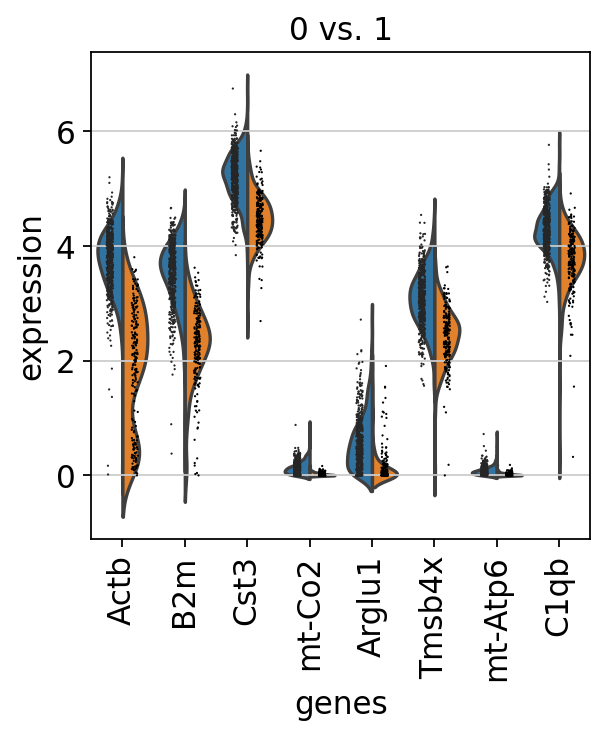

In [76]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups):

In [ ]:
adata = sc.read(results_file)

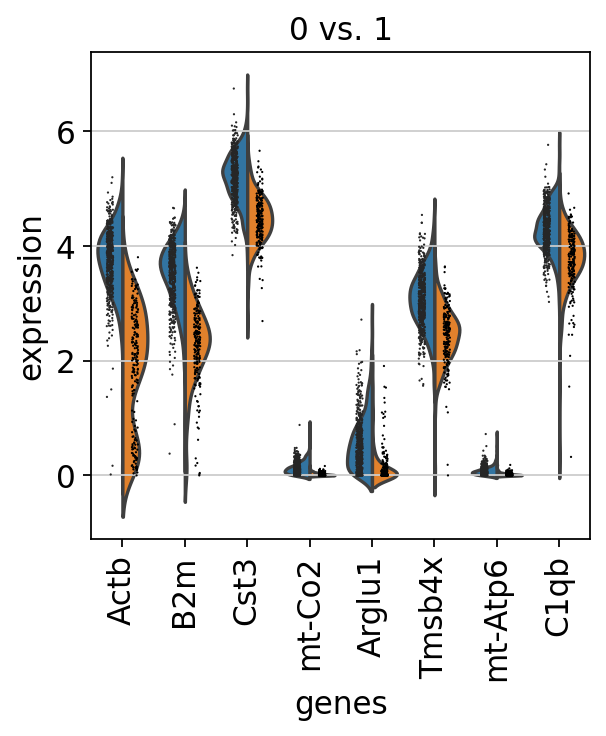

In [77]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

If you want to compare a certain gene across groups, use the following.

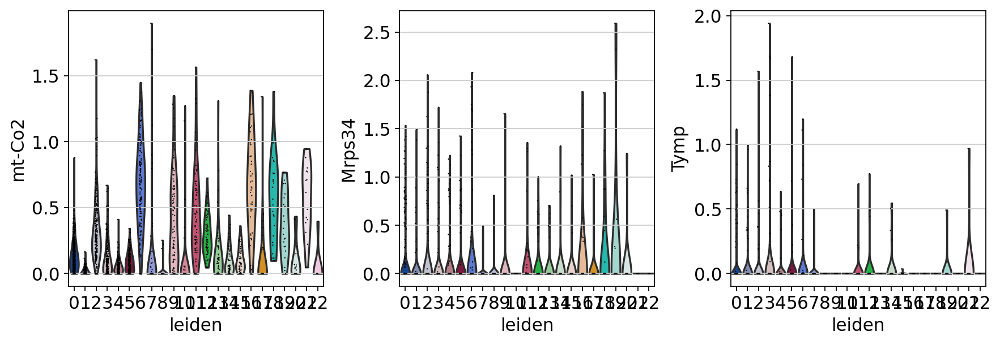

In [78]:
sc.pl.violin(adata, ['mt-Co2', 'Mrps34', 'Tymp'], groupby='leiden')

Actually mark the cell types.

In [ ]:
#new_cluster_names = [
#    'CD4 T', 'CD14 Monocytes',
#    'B', 'CD8 T',
#    'NK', 'FCGR3A Monocytes',
#    'Dendritic', 'Megakaryocytes']
#adata.rename_categories('leiden', new_cluster_names)

In [ ]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

Now that we annotated the cell types, let us visualize the marker genes.

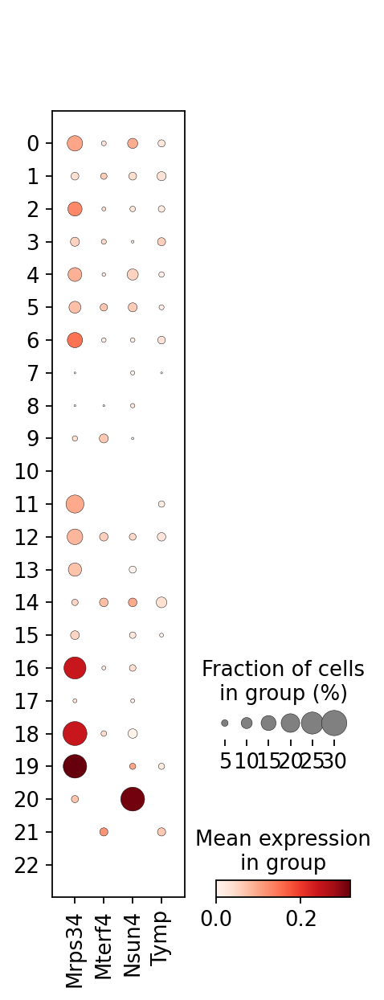

In [79]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden');

There is also a very compact violin plot.

In [ ]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);

During the course of this analysis, the AnnData accumlated the following annotations.

In [ ]:
adata

In [ ]:
adata.write(results_file, compression='gzip') 
# `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using **h5ls**, which has many options - for more details see here. The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations in **adata.raw**.

In [ ]:
#example: adata.raw.to_adata().write('./write/pbmc3k_withoutX.h5ad')

If you want to export to “csv”, you have the following options:

In [ ]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )